In [1]:
import json
import warnings
from pathlib import Path
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
from anndata import AnnData
from h5py import File
import scanpy.external as sce
from matplotlib.image import imread
sc.settings.set_figure_params(figsize=(5, 5))
%config InlineBackend.figure_format = 'retina'

In [2]:
samples_dict = {"CTR": "CTR", "AAV": "AAV"}

In [3]:
adata_dict = dict()
adata_dict["CTR"] = sc.read_h5ad("./ctr-4h-0/binned_outputs_square_008um.h5ad")
adata_dict["AAV"] = sc.read_h5ad("./AAV4h-0/binned_outputs_square_008um.h5ad")
adata_dict

{'CTR': AnnData object with n_obs × n_vars = 155282 × 19059
     obs: 'in_tissue', 'array_row', 'array_col'
     var: 'gene_ids', 'feature_types', 'genome'
     uns: 'spatial'
     obsm: 'spatial',
 'AAV': AnnData object with n_obs × n_vars = 152035 × 19059
     obs: 'in_tissue', 'array_row', 'array_col'
     var: 'gene_ids', 'feature_types', 'genome'
     uns: 'spatial'
     obsm: 'spatial'}

In [4]:
for sample in adata_dict.keys():
    sc.pp.calculate_qc_metrics(
    adata_dict[sample],  inplace=True
)

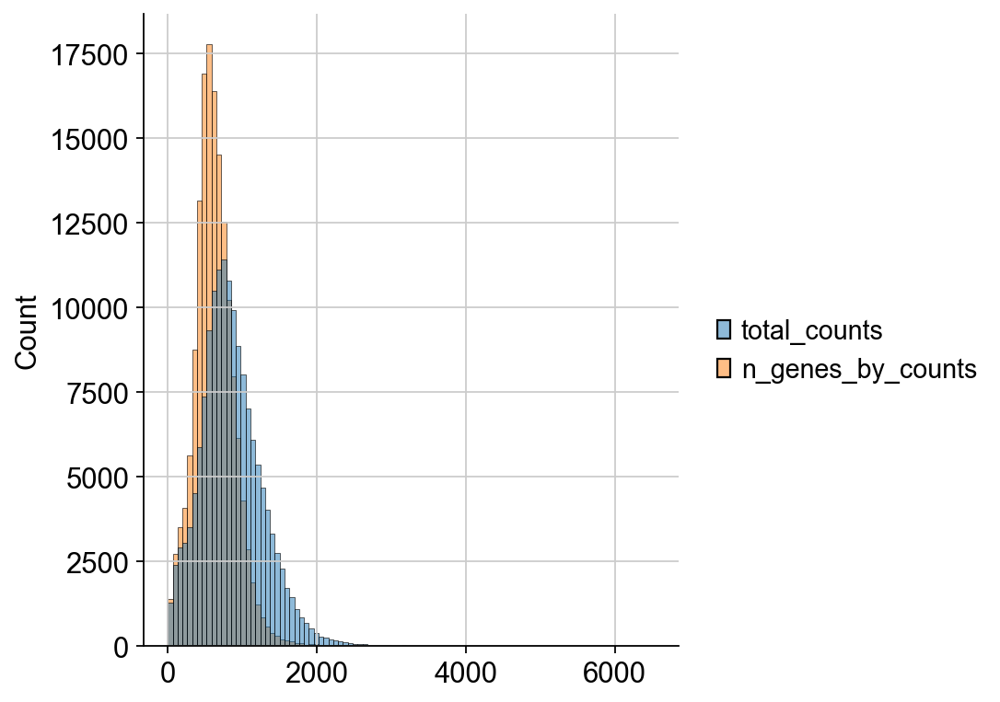

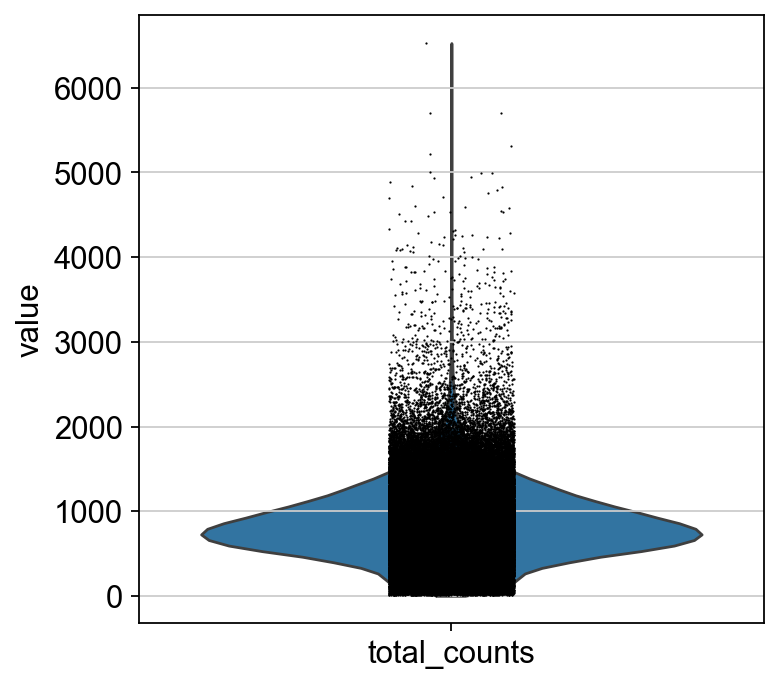

In [5]:
import seaborn as sns
sns.displot(adata_dict["CTR"].obs[["total_counts","n_genes_by_counts"]], bins=100, kde=False)
sc.pl.violin(adata_dict["CTR"], 'total_counts')

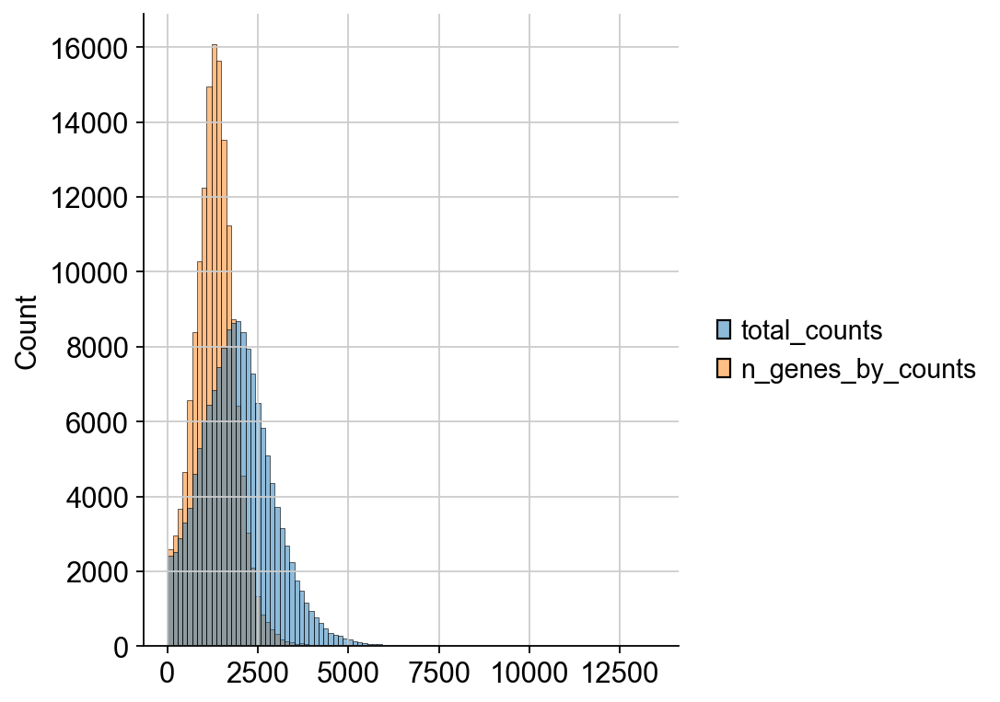

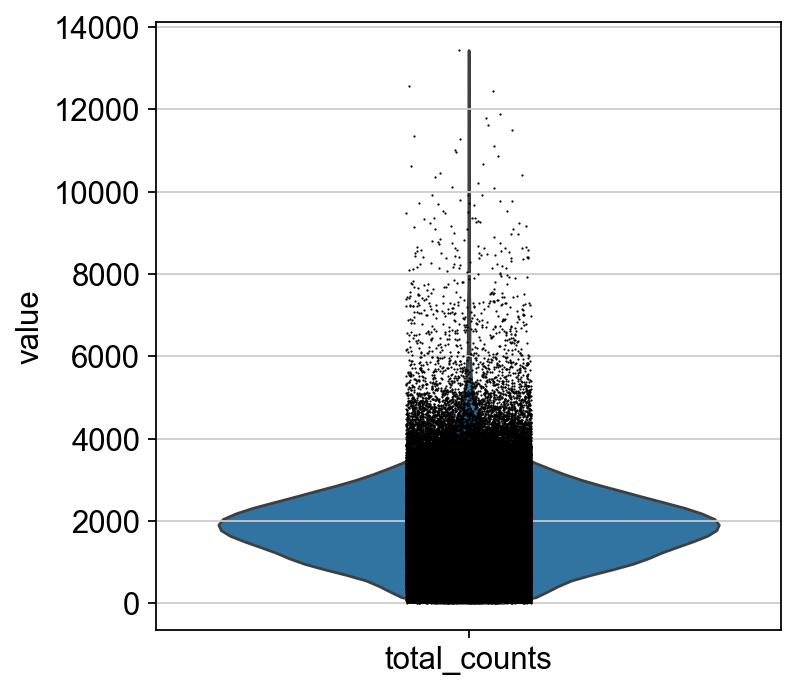

In [6]:
sns.displot(adata_dict["AAV"].obs[["total_counts","n_genes_by_counts"]], bins=100, kde=False)
sc.pl.violin(adata_dict["AAV"], 'total_counts')

In [7]:

adata_ovary_combined_raw = adata_dict[list(samples_dict.keys())[0]].concatenate([adata_dict[x] for x in list(samples_dict.keys())[1:]], batch_key= "Sample", batch_categories=list(samples_dict.keys()))

C:\Users\zyy\AppData\Local\Temp\ipykernel_16192\3429044247.py:1: FutureWarning: Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html
  adata_ovary_combined_raw = adata_dict[list(samples_dict.keys())[0]].concatenate([adata_dict[x] for x in list(samples_dict.keys())[1:]], batch_key= "Sample", batch_categories=list(samples_dict.keys()))


In [9]:
adata_ovary_combined_raw.var_names_make_unique()
print(adata_ovary_combined_raw)

AnnData object with n_obs × n_vars = 307317 × 19059
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'Sample'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts-AAV', 'mean_counts-AAV', 'log1p_mean_counts-AAV', 'pct_dropout_by_counts-AAV', 'total_counts-AAV', 'log1p_total_counts-AAV', 'n_cells_by_counts-CTR', 'mean_counts-CTR', 'log1p_mean_counts-CTR', 'pct_dropout_by_counts-CTR', 'total_counts-CTR', 'log1p_total_counts-CTR'
    obsm: 'spatial'


In [11]:
sc.pp.filter_cells(adata_ovary_combined_raw, min_counts=100)
sc.pp.filter_genes(adata_ovary_combined_raw, min_cells=3)
print(adata_ovary_combined_raw)

AnnData object with n_obs × n_vars = 303411 × 19028
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'Sample', 'n_counts'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts-AAV', 'mean_counts-AAV', 'log1p_mean_counts-AAV', 'pct_dropout_by_counts-AAV', 'total_counts-AAV', 'log1p_total_counts-AAV', 'n_cells_by_counts-CTR', 'mean_counts-CTR', 'log1p_mean_counts-CTR', 'pct_dropout_by_counts-CTR', 'total_counts-CTR', 'log1p_total_counts-CTR', 'n_cells'
    obsm: 'spatial'


In [12]:
adata_ovary_combined_raw.X.max()

582.0

In [13]:
adata_ovary_combined_raw.obs["follicle_annotation"] = sc.read_h5ad("Integrate/follicle_annotation.h5ad").obs.annotation
adata_ovary_combined_raw.obs["follicle_annotation"].value_counts()

follicle_annotation
unassigned            136637
Antral_final_v2       118056
Atretic_final_v2       34085
Preantral_final_v2     14633
Name: count, dtype: int64

In [21]:
adata_ovary_combined_raw.obs["celltype_annotation"] = sc.read_h5ad("Integrate/celltype_annotation.h5ad").obs.annotation
adata_ovary_combined_raw.obs["celltype_annotation"].value_counts()

celltype_annotation
M_Steroidogenic_stromal    55770
GC_Lytic                   44313
Endothelium                42732
GC_Antral                  39480
M_Smooth_Muscle            23452
Immune                     19972
GC_Preantral               17362
M_Fibroblast-like_cells    16788
GC_Atretic                 12044
Epithelium                  9721
M_Pericyte                  8877
M_Dividing_Mesenchyme       7436
Oocyte                      2918
Others                      2535
GC_Mural                      11
Name: count, dtype: int64

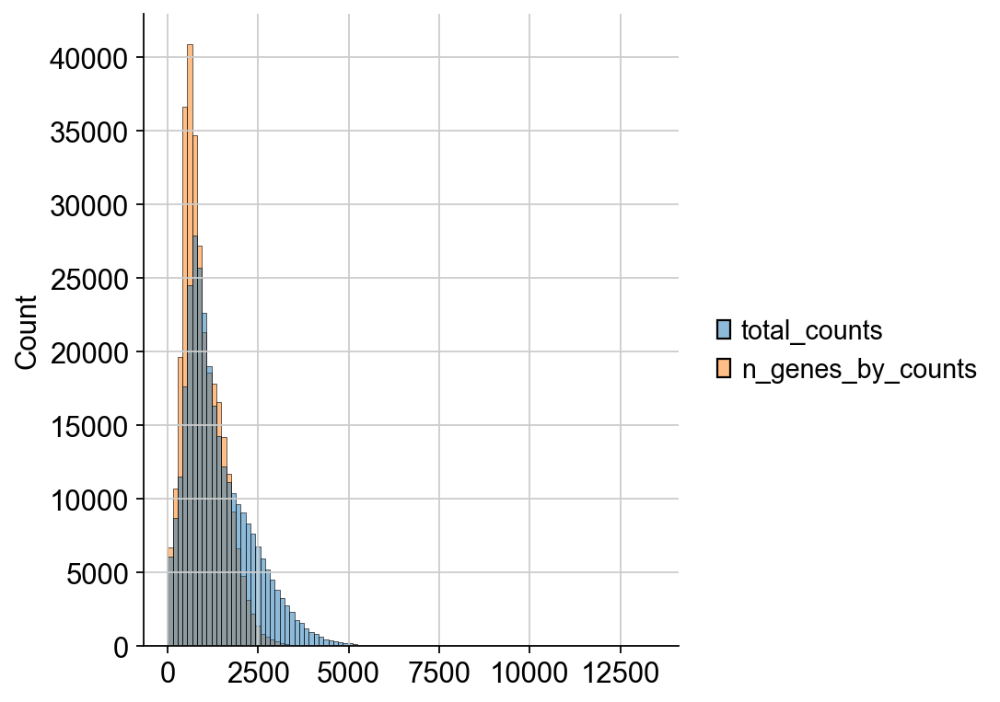

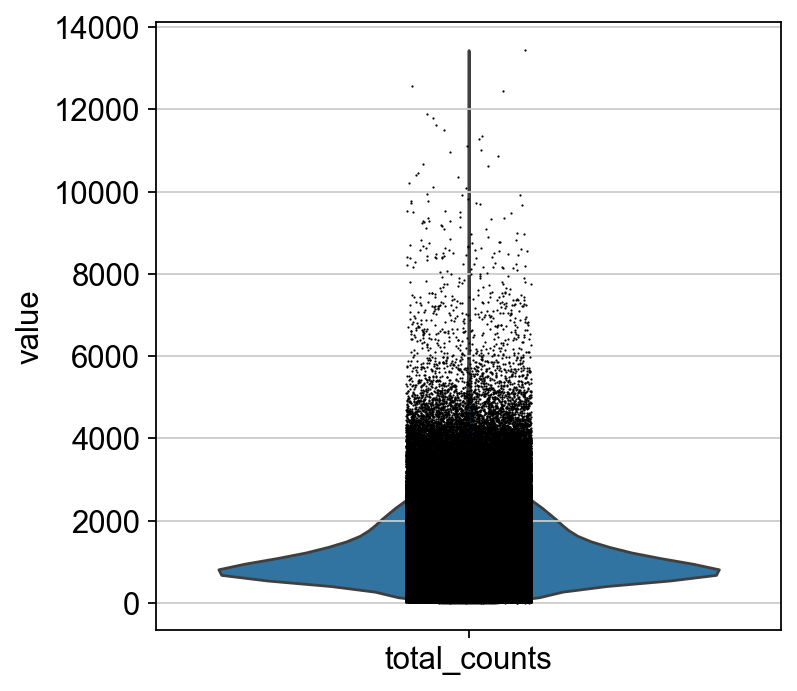

In [57]:
sns.displot(adata_ovary_combined_raw.obs[["total_counts","n_genes_by_counts"]], bins=100, kde=False)
sc.pl.violin(adata_ovary_combined_raw, 'total_counts')

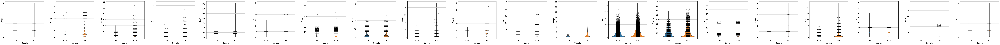

In [14]:
sc.pl.violin(adata_ovary_combined_raw, keys=["Enpp2","Vegfa","Ptgs2", "Ptx3", "Has2", 
                               "Il6",
                               "Areg", "Ereg", "Tnfaip6", "Runx2", 
                               "Pgr", "Lhcgr", "Star","Cyp11a1","Btc","Cd44", "Gja1", "Egfr", "Spp1","Igf1"], 
                 groupby="Sample",
                 log=False, use_raw=None, 
                 stripplot=True, jitter=True, 
                 size=1, layer=None, scale='width', 
                 order=None, multi_panel=None, xlabel='', 
                 ylabel=None, rotation=None, show=None, save=None, ax=None)

In [15]:
#存储原始数据以便后续还原
adata_ovary_combined_raw.layers['counts']=adata_ovary_combined_raw.X.copy()

sc.pp.normalize_total(adata_ovary_combined_raw)
sc.pp.log1p(adata_ovary_combined_raw)
adata_ovary_combined_raw.layers['log1p']=adata_ovary_combined_raw.X.copy()
adata_ovary_combined_raw

AnnData object with n_obs × n_vars = 303411 × 19028
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'Sample', 'n_counts', 'follicle_annotation'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells_by_counts-AAV', 'mean_counts-AAV', 'log1p_mean_counts-AAV', 'pct_dropout_by_counts-AAV', 'total_counts-AAV', 'log1p_total_counts-AAV', 'n_cells_by_counts-CTR', 'mean_counts-CTR', 'log1p_mean_counts-CTR', 'pct_dropout_by_counts-CTR', 'total_counts-CTR', 'log1p_total_counts-CTR', 'n_cells'
    uns: 'Sample_colors', 'log1p'
    obsm: 'spatial'
    layers: 'counts', 'log1p'

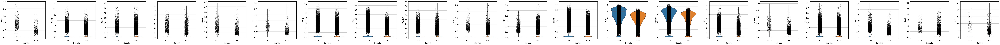

In [16]:
sc.pl.violin(adata_ovary_combined_raw, keys=["Enpp2","Vegfa","Ptgs2", "Ptx3", "Has2", 
                               "Il6",
                               "Areg", "Ereg", "Tnfaip6", "Runx2", 
                               "Pgr", "Lhcgr", "Star","Cyp11a1","Btc","Cd44", "Gja1", "Egfr", "Spp1","Igf1"], 
                 groupby="Sample",
                 log=False, use_raw=None, 
                 stripplot=True, jitter=True, 
                 size=1, layer=None, scale='width', 
                 order=None, multi_panel=2, xlabel='', 
                 ylabel=None, rotation=None, show=None, save=None, ax=None)

In [17]:
sc.tl.rank_genes_groups(adata_ovary_combined_raw, groupby='Sample', method='wilcoxon')

In [18]:
# 查看结果，得到p值
result = adata_ovary_combined_raw.uns['rank_genes_groups']
groups = result['names'].dtype.names

# 打印每个对比组的前3个基因
for group in groups:
    print(f"Group {group}:")
    print("Gene names:", result['names'][group][:3])
    print("P-values:", result['pvals'][group][:3])
    
import pandas as pd
# 提取差异表达数据
def get_rank_genes_groups_df(adata, group):
    result = adata.uns['rank_genes_groups']
    return pd.DataFrame({
        'names': result['names'][group],
        'pvals': result['pvals'][group],
        'logfoldchanges': result['logfoldchanges'][group]
    })
    # 获取特定对比组的DataFrame

df = get_rank_genes_groups_df(adata_ovary_combined_raw, "AAV")


Group CTR:
Gene names: ['Eef1a1' 'mt-Cytb' 'Sparc']
P-values: [0. 0. 0.]
Group AAV:
Gene names: ['mt-Atp8' 'mt-Co3' 'mt-Atp6']
P-values: [0. 0. 0.]


In [19]:
# 查找基因为 'Gpnmb' 或 'Enpp2' 的行
result = df[df['names'].isin(["Enpp2","Vegfa","Ptgs2", "Ptx3", "Has2", 
                               "Il6",
                               "Areg", "Ereg", "Tnfaip6", "Runx2", 
                               "Pgr", "Lhcgr", "Star","Cyp11a1","Btc","Cd44", "Gja1", "Egfr", "Spp1","Igf1"])]

# 显示结果
print(result)

         names          pvals  logfoldchanges
253      Runx2   0.000000e+00        2.693257
666       Gja1   0.000000e+00        0.485079
1279     Vegfa   0.000000e+00        0.275723
1708       Pgr   0.000000e+00        1.678290
2066      Spp1   0.000000e+00        2.417153
2101      Cd44   0.000000e+00        1.948383
2348     Ptgs2   0.000000e+00        0.698951
3974      Igf1  6.836756e-134        3.115143
4216      Areg  1.348164e-117       -0.095966
4881   Tnfaip6   4.612935e-84       -0.070929
6026      Egfr   2.799383e-44       -0.353774
7511       Il6   4.432957e-18        0.766937
9110      Ptx3   6.370559e-06       -0.009000
10900     Has2   1.124422e-01       -0.392314
12009    Enpp2   4.831231e-01       -0.758827
18711      Btc   2.695610e-05       -0.503135
18918    Lhcgr  1.161152e-170       -0.505043
19001     Ereg   0.000000e+00       -0.883633
19012  Cyp11a1   0.000000e+00       -0.486819
19024     Star   0.000000e+00       -0.737146


In [22]:
adata_ovary_combined_raw.write_h5ad("Integrate/adata_ovary_combined_raw_sample_follicle.h5ad")

In [2]:
adata_ovary_combined_raw = sc.read_h5ad("Integrate/adata_ovary_combined_raw_sample_follicle.h5ad")

In [ ]:
adata_ovary_combined_raw.obs.celltype_annotation

,in_tissue,array_row,array_col,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,Sample,n_counts,follicle_annotation,celltype_annotation
s_008um_00301_00321-1-CTR,1,301,321,422,6.047372,481.0,6.177944,22.661123,33.056133,53.846154,100.000000,CTR,481.0,Antral_final_v2,GC_Preantral
s_008um_00593_00642-1-CTR,1,593,642,674,6.514713,993.0,6.901737,31.621349,41.691843,52.265861,82.477341,CTR,993.0,unassigned,GC_Atretic
s_008um_00630_00352-1-CTR,1,630,352,569,6.345636,771.0,6.648984,28.274968,39.169909,52.140078,91.050584,CTR,771.0,unassigned,M_Steroidogenic_stromal
s_008um_00598_00455-1-CTR,1,598,455,449,6.109248,634.0,6.453625,34.227129,44.952681,60.725552,100.000000,CTR,634.0,unassigned,Immune
s_008um_00336_00497-1-CTR,1,336,497,595,6.390241,929.0,6.835185,34.660926,45.425188,57.481163,89.773950,CTR,929.0,Antral_final_v2,GC_Antral
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
s_008um_00252_00421-1-AAV,1,252,421,2874,7.963808,4818.0,8.480322,12.598589,17.849730,25.550021,41.594022,AAV,4818.0,Preantral_final_v2,M_Dividing_Mesenchyme
s_008um_00565_00244-1-AAV,1,565,244,1097,7.001246,1553.0,7.348588,22.343851,29.491307,42.240824,61.558274,AAV,1553.0,unassigned,Endothelium
s_008um_00309_00193-1-AAV,1,309,193,2573,7.853216,3842.0,8.254008,10.176991,15.564810,23.555440,40.369599,AAV,3842.0,Preantral_final_v2,GC_Preantral
s_008um_00373_00222-1-AAV,1,373,222,879,6.779922,1151.0,7.049255,20.069505,28.757602,41.007819,67.072111,AAV,1151.0,unassigned,M_Smooth_Muscle


C:\Users\zyy\AppData\Local\Temp\ipykernel_28076\3524411303.py:26: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  summary_stats = data.groupby("celltype_annotation")["Enpp2_expression"].agg(["mean", "sem"]).reset_index()
C:\Users\zyy\AppData\Local\Temp\ipykernel_28076\3524411303.py:30: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=summary_stats, x="celltype_annotation", y="mean", ci=None)


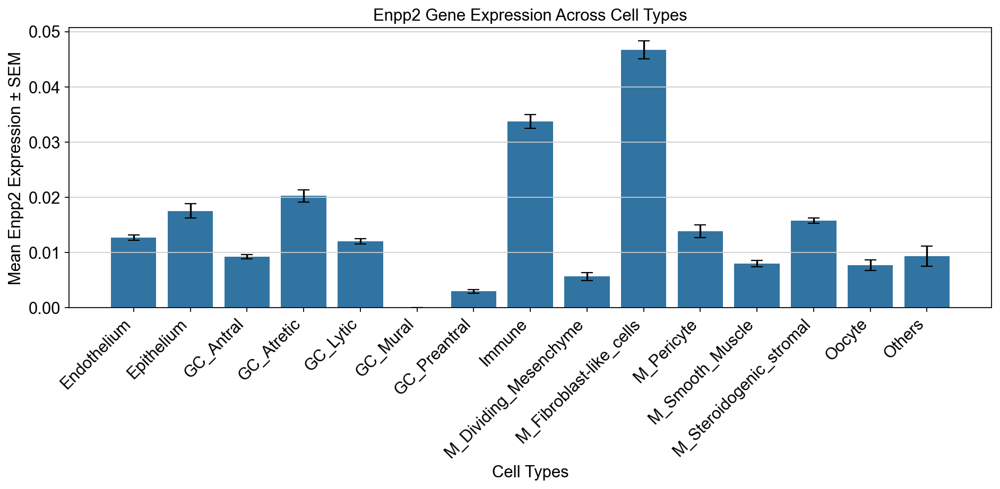

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 确保 AnnData 对象已正确加载
# 示例: adata_ovary_combined_raw = sc.read_h5ad("your_file.h5ad")

# 检查所需列和基因是否存在
if "celltype_annotation" in adata_ovary_combined_raw.obs.columns and "Enpp2" in adata_ovary_combined_raw.var_names:
    # 提取 celltype_annotation 和 Enpp2 的表达量
    celltype_annotation = adata_ovary_combined_raw.obs["celltype_annotation"]
    enpp2_expression = adata_ovary_combined_raw[:, "Enpp2"].X  # 提取 Enpp2 表达矩阵
    
    # 如果表达矩阵是稀疏的，转为密集矩阵并展平
    if hasattr(enpp2_expression, "todense"):
        enpp2_expression = enpp2_expression.todense()
    enpp2_expression = enpp2_expression.A1 if hasattr(enpp2_expression, "A1") else enpp2_expression.flatten()

    # 创建 DataFrame
    data = pd.DataFrame({
        "celltype_annotation": celltype_annotation,
        "Enpp2_expression": enpp2_expression
    })

    # 计算每个细胞类型的平均值和标准误
    summary_stats = data.groupby("celltype_annotation")["Enpp2_expression"].agg(["mean", "sem"]).reset_index()

    # 可视化
    plt.figure(figsize=(12, 6))
    sns.barplot(data=summary_stats, x="celltype_annotation", y="mean", ci=None)
    
    # 添加误差线
    for index, row in summary_stats.iterrows():
        plt.errorbar(
            x=index, 
            y=row["mean"], 
            yerr=row["sem"], 
            fmt='none', 
            c='black', 
            capsize=5
        )

    plt.xticks(range(len(summary_stats["celltype_annotation"])), summary_stats["celltype_annotation"], rotation=45, ha="right")
    plt.title("Enpp2 Gene Expression Across Cell Types")
    plt.ylabel("Mean Enpp2 Expression ± SEM")
    plt.xlabel("Cell Types")
    plt.tight_layout()
    plt.show()
else:
    print("celltype_annotation 或 Enpp2 不存在于数据中，请检查 AnnData 对象。")


C:\Users\zyy\AppData\Local\Temp\ipykernel_28076\692539479.py:26: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  summary_stats = data.groupby("celltype_annotation")["Enpp2_expression"].agg(["mean", "sem"]).reset_index()
C:\Users\zyy\AppData\Local\Temp\ipykernel_28076\692539479.py:30: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=summary_stats, x="celltype_annotation", y="mean", ci=None)


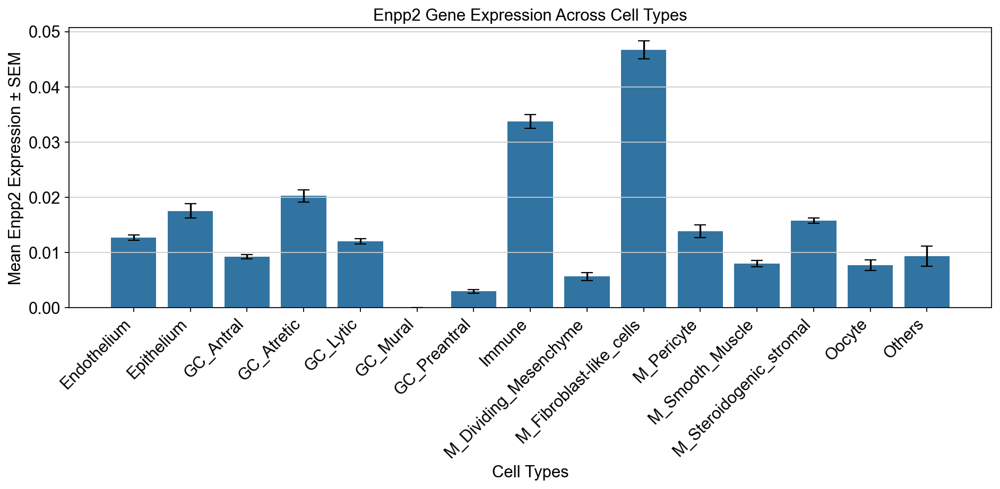

In [6]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 确保 AnnData 对象已正确加载
# 示例: adata_ovary_combined_raw = sc.read_h5ad("your_file.h5ad")

# 检查所需列和基因是否存在
if "celltype_annotation" in adata_ovary_combined_raw.obs.columns and "Enpp2" in adata_ovary_combined_raw.var_names:
    # 提取 celltype_annotation 和 Enpp2 的表达量
    celltype_annotation = adata_ovary_combined_raw.obs["celltype_annotation"]
    enpp2_expression = adata_ovary_combined_raw[:, "Enpp2"].X  # 提取 Enpp2 表达矩阵
    
    # 如果表达矩阵是稀疏的，转为密集矩阵并展平
    if hasattr(enpp2_expression, "todense"):
        enpp2_expression = enpp2_expression.todense()
    enpp2_expression = enpp2_expression.A1 if hasattr(enpp2_expression, "A1") else enpp2_expression.flatten()

    # 创建 DataFrame
    data = pd.DataFrame({
        "celltype_annotation": celltype_annotation,
        "Enpp2_expression": enpp2_expression
    })

    # 计算每个细胞类型的平均值和标准误
    summary_stats = data.groupby("celltype_annotation")["Enpp2_expression"].agg(["mean", "sem"]).reset_index()

    # 可视化并保存为 PDF
    plt.figure(figsize=(12, 6))
    sns.barplot(data=summary_stats, x="celltype_annotation", y="mean", ci=None)
    
    # 添加误差线
    for index, row in summary_stats.iterrows():
        plt.errorbar(
            x=index, 
            y=row["mean"], 
            yerr=row["sem"], 
            fmt='none', 
            c='black', 
            capsize=5
        )

    plt.xticks(range(len(summary_stats["celltype_annotation"])), summary_stats["celltype_annotation"], rotation=45, ha="right")
    plt.title("Enpp2 Gene Expression Across Cell Types")
    plt.ylabel("Mean Enpp2 Expression ± SEM")
    plt.xlabel("Cell Types")
    plt.tight_layout()
    
    # 保存为 PDF 文件
    plt.savefig("Enpp2_expression_across_cell_types.pdf", format="pdf")
    plt.show()
else:
    print("celltype_annotation 或 Enpp2 不存在于数据中，请检查 AnnData 对象。")


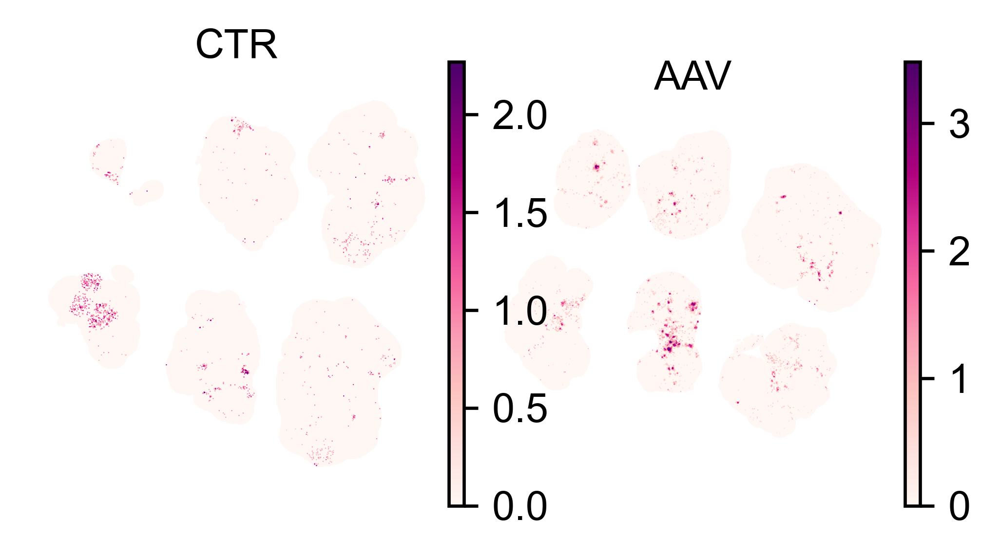

In [66]:
import scanpy as sc
import matplotlib.pyplot as plt

# 设置图形参数
sc.settings.set_figure_params(dpi=300, dpi_save=300, fontsize=10, facecolor='white', frameon=False, figsize=(2.0, 2.0), vector_friendly=False, transparent=True, format="pdf")
grouping_var = "Gpnmb"
fig, axs = plt.subplots(1, 2, figsize=(4, 2))  # 修改为一行两列布局

handles, labels = None, None  # 初始化图例变量

for i, sample in enumerate(samples_dict.keys()):
    subset = adata_ovary_combined_raw[adata_ovary_combined_raw.obs["Sample"] == sample]
    
    ax = axs[i]  # 修改为一维索引
    
    if i == 1:
        sc.pl.spatial(subset, color=[grouping_var], wspace=0.0, hspace=0.0, spot_size=30, frameon=False, title=sample, show=False, ax=ax, cmap="RdPu")
        handles, labels = ax.get_legend_handles_labels()
        legend = ax.get_legend()
        if legend:
            legend.remove()  # 如果存在图例，则将其移除
    else:
        sc.pl.spatial(subset, color=[grouping_var], wspace=0.0, hspace=0.0, spot_size=30, frameon=False, title=sample, show=False, legend_loc="none", ax=ax, cmap="RdPu")

# 仅在 handles 和 labels 不为 None 时添加全局图例
if handles and labels:
    fig.legend(handles, labels, loc='right', bbox_to_anchor=(0.98, 0.5))

plt.subplots_adjust(wspace=0, hspace=0)
plt.show()

KeyError: 'Could not find key Pparh in .var_names or .obs.columns.'

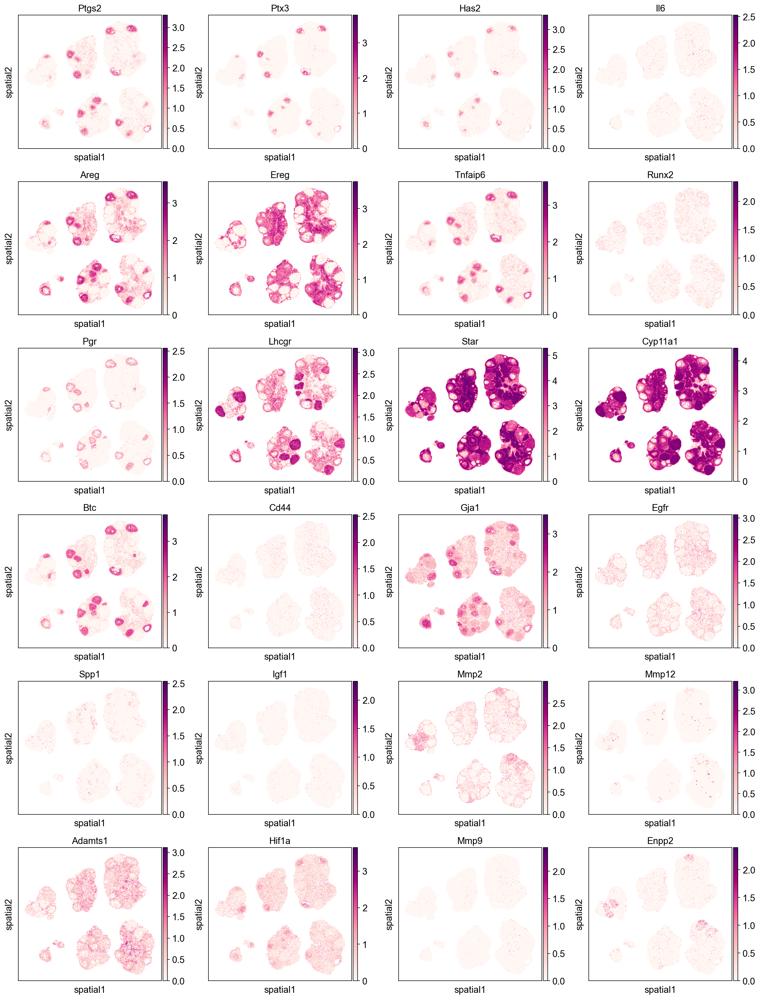

In [6]:
sc.settings.set_figure_params(dpi=80, facecolor='white', frameon=True, figsize=(4, 4))
subset = adata_ovary_combined_raw[adata_ovary_combined_raw.obs["Sample"] == "CTR"]
# Preantral
sc.pl.spatial(subset, color = ["Ptgs2", "Ptx3", "Has2", 
                               "Il6",
                               "Areg", "Ereg", "Tnfaip6", "Runx2", 
                               "Pgr", "Lhcgr", "Star","Cyp11a1","Btc","Cd44", "Gja1", "Egfr", "Spp1","Igf1",
                               'Mmp2','Mmp12','Adamts1','Hif1a','Mmp9','Enpp2'], spot_size=30,cmap="RdPu")


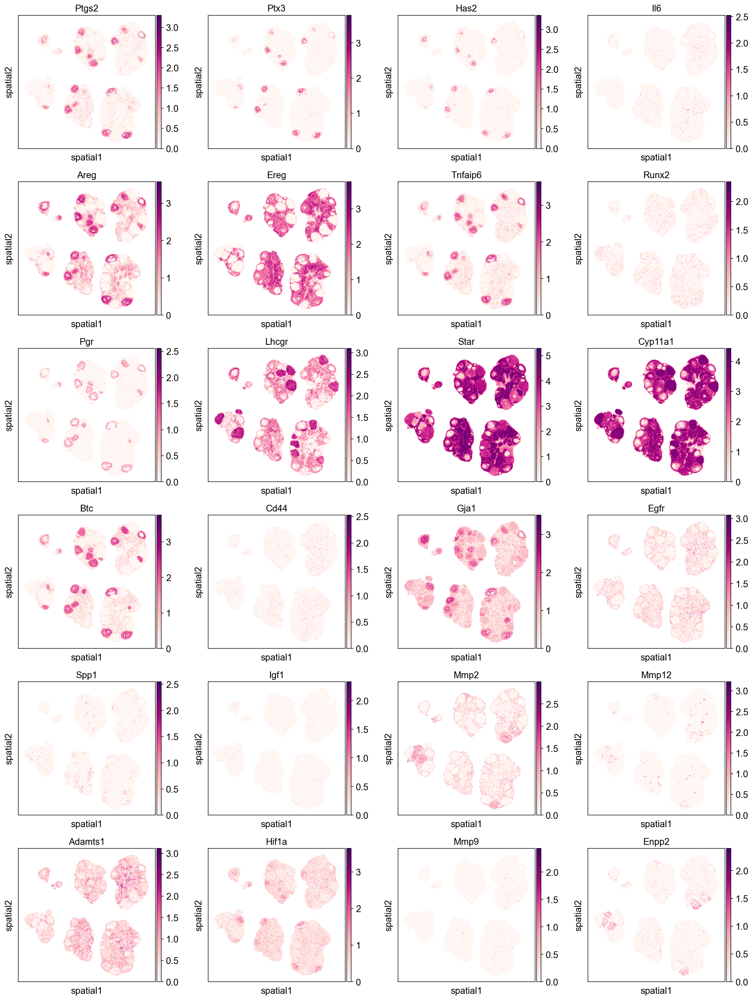

In [7]:
import scanpy as sc
import matplotlib.pyplot as plt

# 设置图像参数
sc.settings.set_figure_params(dpi=80, facecolor='white', frameon=True, figsize=(4, 4))

# 获取子集数据
subset = adata_ovary_combined_raw[adata_ovary_combined_raw.obs["Sample"] == "CTR"]

# 绘制并保存图像
sc.pl.spatial(subset, color = ["Ptgs2", "Ptx3", "Has2", 
                               "Il6",
                               "Areg", "Ereg", "Tnfaip6", "Runx2", 
                               "Pgr", "Lhcgr", "Star","Cyp11a1","Btc","Cd44", "Gja1", "Egfr", "Spp1","Igf1",
                               'Mmp2','Mmp12','Adamts1','Hif1a','Mmp9','Enpp2'], spot_size=30, cmap="RdPu", show=False)

# 保存图像为 PDF 文件
plt.savefig("figures/spatial_plot_ctr_genes.pdf")

# 显示图像
plt.show()


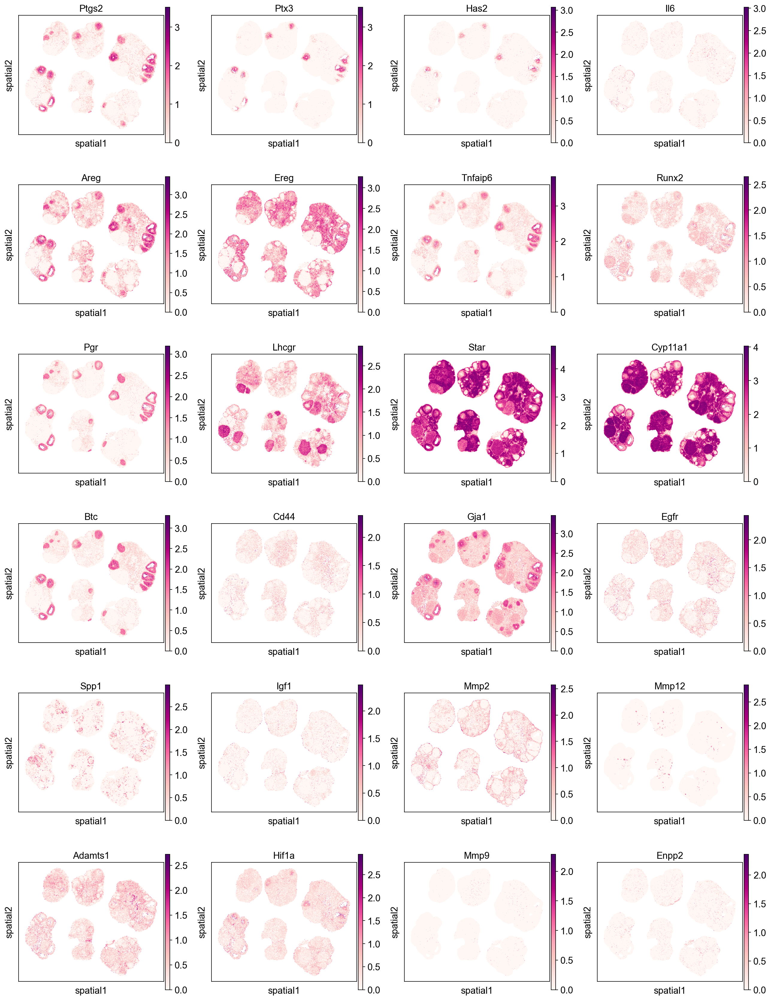

In [8]:
import scanpy as sc
import matplotlib.pyplot as plt

# 设置图像参数
sc.settings.set_figure_params(dpi=80, facecolor='white', frameon=True, figsize=(4, 4))

# 获取子集数据
subset = adata_ovary_combined_raw[adata_ovary_combined_raw.obs["Sample"] == "AAV"]

# 绘制并保存图像
sc.pl.spatial(subset, color = ["Ptgs2", "Ptx3", "Has2", 
                               "Il6",
                               "Areg", "Ereg", "Tnfaip6", "Runx2", 
                               "Pgr", "Lhcgr", "Star","Cyp11a1","Btc","Cd44", "Gja1", "Egfr", "Spp1","Igf1",
                               'Mmp2','Mmp12','Adamts1','Hif1a','Mmp9','Enpp2'], spot_size=30, cmap="RdPu", show=False)

# 保存图像为 PDF 文件
plt.savefig("figures/spatial_plot_aav_genes.pdf")

# 显示图像
plt.show()


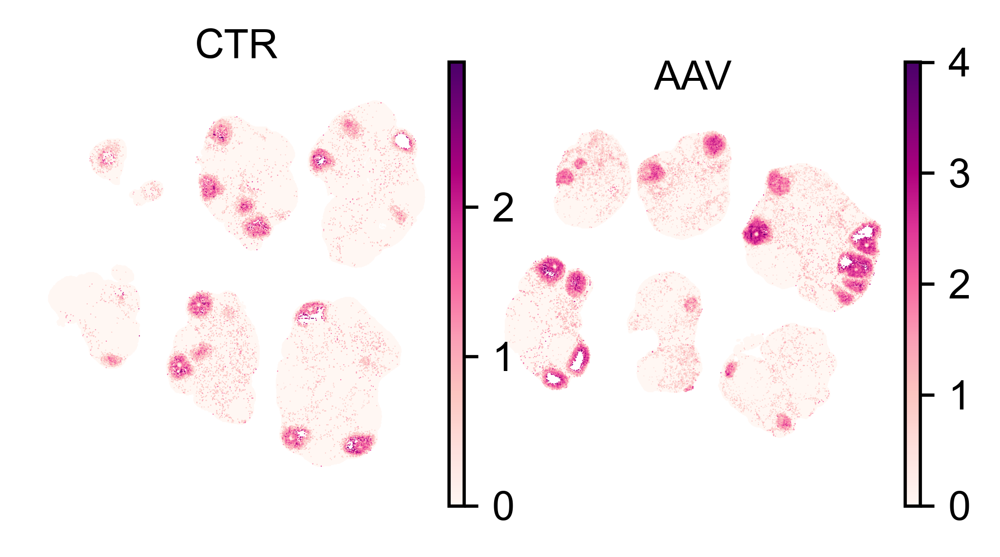

In [10]:
import scanpy as sc
import matplotlib.pyplot as plt

# 设置图形参数
sc.settings.set_figure_params(dpi=300, dpi_save=300, fontsize=10, facecolor='white', frameon=False, figsize=(2.0, 2.0), vector_friendly=False, transparent=True, format="pdf")
grouping_var = "Ptgs2"
fig, axs = plt.subplots(1, 2, figsize=(4, 2))  # 修改为一行两列布局

handles, labels = None, None  # 初始化图例变量

for i, sample in enumerate(samples_dict.keys()):
    subset = adata_ovary_combined_raw[adata_ovary_combined_raw.obs["Sample"] == sample]
    
    ax = axs[i]  # 修改为一维索引
    
    if i == 1:
        sc.pl.spatial(subset, color=[grouping_var], wspace=0.0, hspace=0.0, spot_size=30, frameon=False, title=sample, show=False, ax=ax, cmap="RdPu")
        handles, labels = ax.get_legend_handles_labels()
        legend = ax.get_legend()
        if legend:
            legend.remove()  # 如果存在图例，则将其移除
    else:
        sc.pl.spatial(subset, color=[grouping_var], wspace=0.0, hspace=0.0, spot_size=30, frameon=False, title=sample, show=False, legend_loc="none", ax=ax, cmap="RdPu")

# 仅在 handles 和 labels 不为 None 时添加全局图例
if handles and labels:
    fig.legend(handles, labels, loc='right', bbox_to_anchor=(0.98, 0.5))

plt.subplots_adjust(wspace=0, hspace=0)
plt.show()

In [21]:
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# 假设你感兴趣的基因是 "Gpnmb"
gene_of_interest = "Gpnmb"

# 提取基因表达量和样本信息（包括时间点）
gene_expr = adata_ovary_combined_raw[:, gene_of_interest].X.toarray().flatten()
time_points = adata_ovary_combined_raw.obs["Sample"].tolist()  # 假设时间点数据保存在 "TimePoint" 列

# 创建 DataFrame 以便使用 seaborn
data = pd.DataFrame({
    "Gene Expression": gene_expr,
    "TimePoint": time_points
})

# 计算每个时间点上的平均表达量和标准误
summary_stats = data.groupby("TimePoint").agg(
    mean_expr=('Gene Expression', 'mean'),
    sem_expr=('Gene Expression', 'sem')
).reset_index()

# 自定义调色板
custom_palette = sns.color_palette("viridis", len(summary_stats["TimePoint"].unique()))

# 绘制小提琴图
plt.figure(figsize=(12, 6))
ax = sns.violinplot(x="TimePoint", y="Gene Expression", data=data, inner=None, palette=custom_palette)
ax = sns.swarmplot(x="TimePoint", y="Gene Expression", data=data, color="k", alpha=0.5)

# 绘制误差棒图
plt.errorbar(summary_stats["TimePoint"], summary_stats["mean_expr"], yerr=summary_stats["sem_expr"], fmt='o', color='red')

plt.title(f"Expression of {gene_of_interest} Across Different Time Points")



KeyboardInterrupt: 